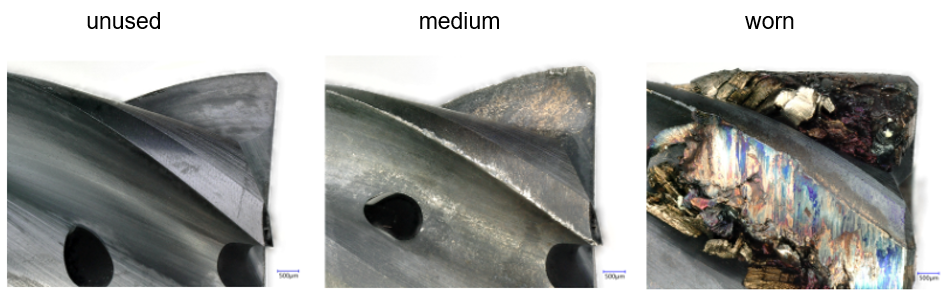

In [1]:
import numpy as np
import matplotlib.pylab as plt

import tensorflow as tf
import tensorflow_hub as hub

In [2]:
imagenet = "https://tfhub.dev/google/imagenet/mobilenet_v1_100_224/classification/5"
feature_extractor = hub.KerasLayer(imagenet, input_shape=(224, 224, 3), trainable=False)

model_regnet = tf.keras.Sequential([feature_extractor])
model_regnet.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              4254889   
                                                                 
Total params: 4,254,889
Trainable params: 0
Non-trainable params: 4,254,889
_________________________________________________________________


In [3]:
model_tool = tf.keras.Sequential([feature_extractor])
model_tool.add(tf.keras.layers.Dense(3))
model_tool.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              4254889   
                                                                 
 dense (Dense)               (None, 3)                 3006      
                                                                 
Total params: 4,257,895
Trainable params: 3,006
Non-trainable params: 4,254,889
_________________________________________________________________


In [4]:
model_tool.compile(optimizer = 'Adam', loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),metrics=['acc'])

In [5]:
class CollectBatchStats(tf.keras.callbacks.Callback):
  def __init__(self):
    self.batch_losses = []
    self.batch_acc = []

  def on_train_batch_end(self, batch, logs=None):
    self.batch_losses.append(logs['loss'])
    self.batch_acc.append(logs['acc'])
    self.model.reset_metrics()

batch_stats_callback = CollectBatchStats()

In [6]:
IMAGE_SHAPE = (224, 224)
image_generator = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1/255)

training_data="C:\\Users\\sohan\\Documents\\DIT\\WS-22-23\\ML2\\ex2\\dataset_wear\\training"
training_image_data  = image_generator.flow_from_directory(training_data,target_size=IMAGE_SHAPE)

validation_data="C:\\Users\\sohan\\Documents\\DIT\\WS-22-23\\ML2\\ex2\\dataset_wear\\validation" 
validation_image_data  = image_generator.flow_from_directory(validation_data,target_size=IMAGE_SHAPE)

Found 170 images belonging to 3 classes.
Found 92 images belonging to 3 classes.


In [34]:
history = model_tool.fit(training_image_data, epochs = 2,
                      validation_data=validation_image_data, callbacks=[batch_stats_callback])

Epoch 1/2
6/6 [==============================] - 6s 1s/step - loss: 0.0162 - acc: 1.0000 - val_loss: 0.1021 - val_acc: 0.9565
Epoch 2/2
6/6 [==============================] - 6s 1s/step - loss: 0.0067 - acc: 1.0000 - val_loss: 0.0945 - val_acc: 0.9565


In [8]:
test_data="C:\\Users\\sohan\\Documents\\DIT\\WS-22-23\\ML2\\ex2\\dataset_wear\\test"
test_image_data  = image_generator.flow_from_directory(test_data,target_size=IMAGE_SHAPE, batch_size=150)

Found 119 images belonging to 3 classes.


In [9]:
for image_batch, label_batch in test_image_data:
  print("Image batch shape: ", image_batch.shape)
  print("Label batch shape: ", label_batch.shape)
  break

Image batch shape:  (119, 224, 224, 3)
Label batch shape:  (119, 3)


In [35]:
predicted_batch = model_tool.predict(image_batch)
predicted_id = np.argmax(predicted_batch, axis=-1)
label_id = np.argmax(label_batch, axis=-1)

4/4 [==============================] - 1s 315ms/step


In [36]:
from sklearn.metrics import classification_report
print(classification_report(label_id, predicted_id, zero_division=0))

              precision    recall  f1-score   support

           0       0.99      0.97      0.98        76
           1       0.97      1.00      0.98        30
           2       0.92      0.92      0.92        13

    accuracy                           0.97       119
   macro avg       0.96      0.97      0.96       119
weighted avg       0.97      0.97      0.97       119



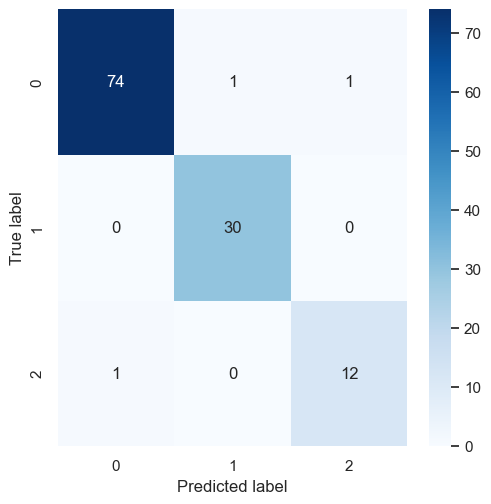

In [37]:
import numpy as np; np.random.seed(0)
import seaborn as sns; sns.set_theme()

con_mat_df=tf.math.confusion_matrix(
    labels = label_id , predictions = predicted_id
)

figure = plt.figure(figsize=(5, 5))
sns.heatmap(con_mat_df, annot=True,cmap=plt.cm.Blues)
plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

In [41]:
class_names = sorted(training_image_data.class_indices.items(), key=lambda pair:pair[1])
class_names = np.array([key.title() for key, value in class_names])
class_names

array(['Medium', 'Unused', 'Worn'], dtype='<U6')

In [42]:
arr = model_tool.predict(image_batch)
predicted_id = np.argmax(arr, axis=-1)
predicted_label_batch = class_names[predicted_id]
label_id = np.argmax(label_batch, axis=-1)
true_label_batch = class_names[label_id]

4/4 [==============================] - 1s 311ms/step


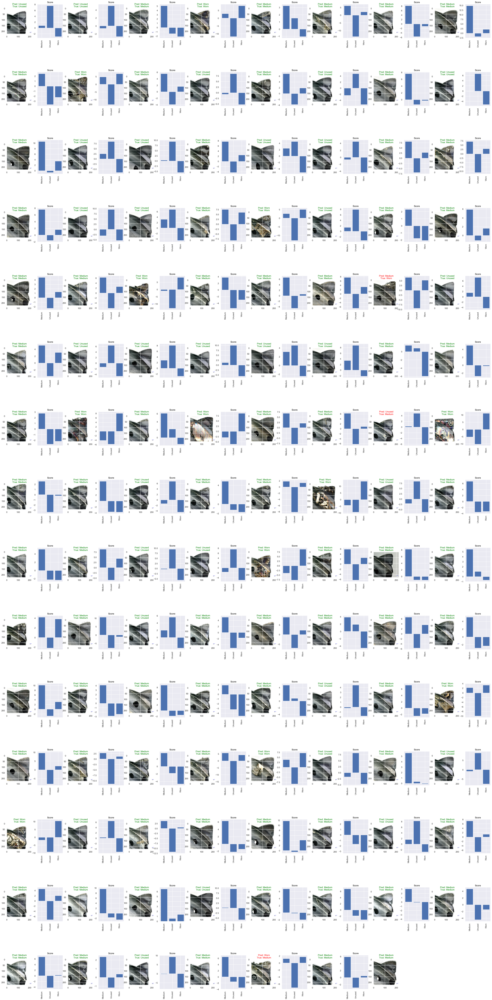

In [61]:
img_counter=0
prob_counter=0

plt.figure(figsize=(45,200))
plt.subplots_adjust(hspace=1)
for n in range(len(label_batch)*2-1):
  
  plt.subplot(32,16,n+1)
  if(n%2==0):
      plt.imshow(image_batch[img_counter])
      color = "green" if predicted_id[img_counter] == label_id[img_counter] else "red"
      plt.title("Pred: "+predicted_label_batch[img_counter].title()+"\nTrue: "+true_label_batch[img_counter], color=color)
      img_counter=img_counter+1

  if(n%2==1):
      plt.title("Score", color="Black")

      data=[arr[prob_counter][0],arr[prob_counter][1],arr[prob_counter][2]]#,arr[prob_counter][3], arr[prob_counter][4], arr[prob_counter][5]]
      plt.bar(class_names,data)
      plt.xticks(rotation='vertical')
      
      prob_counter=prob_counter+1     